# Preprocessing & Modeling

In [1]:
# Load appropriate modules
from os import listdir
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import glob
from pathlib import Path
from keras.models import Sequential
#Import from keras_preprocessing not from keras.preprocessing
from keras_preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras import regularizers, optimizers
from keras import metrics
plt.style.use('seaborn')
plt.rcParams["figure.figsize"] = (8, 8)
%matplotlib inline

#### Load in Dataframe


In [2]:
train_df = pd.read_csv(r"C:/Users/Jake Wojcik/Documents/Springboard/DS Career Track Course/Capstone_3/Data/train_data.csv",index_col=0)
test_df = pd.read_csv(r"C:/Users/Jake Wojcik/Documents/Springboard/DS Career Track Course/Capstone_3/Data/test_data.csv",index_col=0)

In [3]:
# Convert image back to Uint8 in order to show images
train_df['image'] = train_df['path'].map(lambda x: plt.imread(x))
test_df['image'] = test_df['path'].map(lambda x: plt.imread(x))

In [4]:
#Separate train & validation sets
validation_df = train_df[train_df['data_split']=='validation_another']
train_df = train_df[train_df['data_split']=='train_another']

In [5]:
# separate test dataset into balanced and unbalanced sets
test_balanced_df = test_df[test_df['data_split']=='test']
test_unbalanced_df = test_df[test_df['data_split']=='test_another']

In [6]:
#Randomly shuffle dataframes
train_df = train_df.sample(frac=1).reset_index(drop=True)
validation_df = validation_df.sample(frac=1).reset_index(drop=True)
test_balanced_df = test_balanced_df.sample(frac=1).reset_index(drop=True)
test_unbalanced_df = test_unbalanced_df.sample(frac=1).reset_index(drop=True)

### Create Generators 

To avoid overfitting we'll augment the training set through random rotation, horizontal flip, vertical and horizontal shift, shear, and zoom. Hopefully this will lead to better generalization and achieve better validation and test accuracy.

In [7]:
datagen=ImageDataGenerator(rescale=1./255.,rotation_range=30, fill_mode='nearest',
                           width_shift_range=0.2, height_shift_range=0.2,
                           horizontal_flip=True, vertical_flip=True,zoom_range=0.3,shear_range=.2)
#generate train Dataframe
train_generator= datagen.flow_from_dataframe(
dataframe=train_df,
directory=None,
x_col="path",
y_col="damage",
subset="training",
batch_size=50,
seed=9,
shuffle=False,
class_mode="binary",
target_size=(128,128))

# Generate validation dataframe
validation_generator= datagen.flow_from_dataframe(
dataframe=validation_df,
directory=None,
x_col="path",
y_col="damage",
batch_size=50,
seed=9,
shuffle=False,
class_mode="binary",
target_size=(128,128))

#Generate balanced test dataframe
test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_dataframe(
dataframe=test_balanced_df,
directory=None,
x_col="path",
y_col="damage",
batch_size=50,
seed=9,
shuffle=False,
class_mode='binary',
target_size=(128,128))

#Generate unbalanced test dataframe
test_datagen_un = ImageDataGenerator(rescale=1./255.)
test_generator_un = test_datagen.flow_from_dataframe(
dataframe=test_unbalanced_df,
directory=None,
x_col="path",
y_col="damage",
batch_size=50,
seed=9,
shuffle=False,
class_mode='binary',
target_size=(128,128))

Found 10000 validated image filenames belonging to 2 classes.
Found 2000 validated image filenames belonging to 2 classes.
Found 2000 validated image filenames belonging to 2 classes.
Found 9000 validated image filenames belonging to 2 classes.


#### Define custom metrics for the model

Because we are dealing with an unbalanced test set accuracy is not the best metric for success. We'll use precision, recall, and f1 score in order to measure our models success. 

In [8]:
from keras import backend as K

def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

### Build the Model

The convolutional neural network (CNN)  often yields outstanding results over other algorithms for computer vision tasks such as object categorization, image classification, and object recognition. Structurally, CNN is a feed-forward network that is particularly powerful in extracting hierarchical features from images. The common structure of CNN
has three components: the convolutional layer, the subsampling layer, and the fully connected layer. To build our model we use a number of convolutional layers with a 3x3 filter followed by a max pooling layer until we reach a fully connected layer. In our first layer, we have 32 filters that represent 32 ways to extract features from the previous layers and form
a stack of 32 feature matrices. The max pooling layer reduces the input feature matrix to half its number of columns and rows, which helps to reduce the resolution by a factor of 4 and the network's sensitivity to distortion. After the features are extracted and the resolution reduced, we add a flattening layer that will transform the matrix into a feature vector. We then add a dropout layer that prevents overfitting. Dropout prevents neurons from remebering too much training data by droppping randomly chosen neurons. Finally, we feed this vector into a fully connected layer in which predictions can be made. 

For activation functions in the CNN, a rectified linear unit (ReLU) is a common choice. ReLU will output the input directly if it is positive, otherwise, it will output zero. The rectified linear activation function overcomes the vanishing gradient problem, allowing models to learn faster and perform better. For the fully connected layer we use a sigmoid function in order to produce a probability of each class. 


In [9]:
model = Sequential()
model.add(Conv2D(32,(3,3),activation='relu',input_shape=(128,128,3)))
model.add(MaxPooling2D((2,2)))
model.add(Conv2D(64,(3,3),activation='relu'))
model.add(MaxPooling2D((2,2)))
model.add(Conv2D(128,(3,3),activation='relu'))
model.add(MaxPooling2D((2,2)))
model.add(Conv2D(128,(3,3),activation='relu'))
model.add(MaxPooling2D((2,2)))
model.add(Flatten())
model.add(Dropout(.2))
model.add(Dense(512,activation='relu'))
model.add(Dense(1,activation='sigmoid'))
#Compile
model.compile(loss='binary_crossentropy',optimizer = 'Adam',metrics=['accuracy',f1_m, recall_m, precision_m])

### Train the model

In [10]:
train_steps = train_generator.n//train_generator.batch_size
validation_steps = validation_generator.n//validation_generator.batch_size

history = model.fit(train_generator,steps_per_epoch=train_steps,validation_data=validation_generator,validation_steps=validation_steps,epochs=100)

Epoch 1/100
200/200 [==============================] - 137s 683ms/step - loss: 0.4708 - accuracy: 0.7736 - f1_m: 0.7841 - recall_m: 0.8518 - precision_m: 0.7582 - val_loss: 0.2838 - val_accuracy: 0.8770 - val_f1_m: 0.8807 - val_recall_m: 0.9333 - val_precision_m: 0.8369
Epoch 2/100
200/200 [==============================] - 132s 662ms/step - loss: 0.2334 - accuracy: 0.9079 - f1_m: 0.9053 - recall_m: 0.8986 - precision_m: 0.9186 - val_loss: 0.2365 - val_accuracy: 0.8995 - val_f1_m: 0.8857 - val_recall_m: 0.8148 - val_precision_m: 0.9777
Epoch 3/100
200/200 [==============================] - 137s 685ms/step - loss: 0.2140 - accuracy: 0.9164 - f1_m: 0.9139 - recall_m: 0.9034 - precision_m: 0.9304 - val_loss: 0.2874 - val_accuracy: 0.8965 - val_f1_m: 0.8980 - val_recall_m: 0.9331 - val_precision_m: 0.8692
Epoch 4/100
200/200 [==============================] - 132s 659ms/step - loss: 0.2109 - accuracy: 0.9190 - f1_m: 0.9166 - recall_m: 0.9112 - precision_m: 0.9287 - val_loss: 0.1974 - val_a

200/200 [==============================] - 135s 677ms/step - loss: 0.1008 - accuracy: 0.9602 - f1_m: 0.9592 - recall_m: 0.9603 - precision_m: 0.9606 - val_loss: 0.1091 - val_accuracy: 0.9555 - val_f1_m: 0.9515 - val_recall_m: 0.9335 - val_precision_m: 0.9728
Epoch 32/100
200/200 [==============================] - 136s 681ms/step - loss: 0.0900 - accuracy: 0.9658 - f1_m: 0.9651 - recall_m: 0.9646 - precision_m: 0.9670 - val_loss: 0.0953 - val_accuracy: 0.9665 - val_f1_m: 0.9659 - val_recall_m: 0.9805 - val_precision_m: 0.9530
Epoch 33/100
200/200 [==============================] - 136s 679ms/step - loss: 0.0868 - accuracy: 0.9671 - f1_m: 0.9662 - recall_m: 0.9662 - precision_m: 0.9678 - val_loss: 0.0729 - val_accuracy: 0.9720 - val_f1_m: 0.9708 - val_recall_m: 0.9677 - val_precision_m: 0.9751
Epoch 34/100
200/200 [==============================] - 139s 694ms/step - loss: 0.0906 - accuracy: 0.9665 - f1_m: 0.9657 - recall_m: 0.9654 - precision_m: 0.9679 - val_loss: 0.0962 - val_accuracy: 

200/200 [==============================] - 148s 740ms/step - loss: 0.0617 - accuracy: 0.9773 - f1_m: 0.9770 - recall_m: 0.9770 - precision_m: 0.9781 - val_loss: 0.0862 - val_accuracy: 0.9670 - val_f1_m: 0.9647 - val_recall_m: 0.9517 - val_precision_m: 0.9799
Epoch 62/100
200/200 [==============================] - 150s 748ms/step - loss: 0.0691 - accuracy: 0.9743 - f1_m: 0.9735 - recall_m: 0.9724 - precision_m: 0.9758 - val_loss: 0.1107 - val_accuracy: 0.9630 - val_f1_m: 0.9604 - val_recall_m: 0.9373 - val_precision_m: 0.9866
Epoch 63/100
200/200 [==============================] - 144s 720ms/step - loss: 0.0632 - accuracy: 0.9756 - f1_m: 0.9752 - recall_m: 0.9761 - precision_m: 0.9754 - val_loss: 0.0848 - val_accuracy: 0.9695 - val_f1_m: 0.9687 - val_recall_m: 0.9544 - val_precision_m: 0.9848
Epoch 64/100
200/200 [==============================] - 152s 759ms/step - loss: 0.0678 - accuracy: 0.9753 - f1_m: 0.9746 - recall_m: 0.9741 - precision_m: 0.9765 - val_loss: 0.0769 - val_accuracy: 

200/200 [==============================] - 155s 775ms/step - loss: 0.0530 - accuracy: 0.9799 - f1_m: 0.9795 - recall_m: 0.9789 - precision_m: 0.9811 - val_loss: 0.0599 - val_accuracy: 0.9795 - val_f1_m: 0.9785 - val_recall_m: 0.9808 - val_precision_m: 0.9772
Epoch 92/100
200/200 [==============================] - 159s 795ms/step - loss: 0.0528 - accuracy: 0.9815 - f1_m: 0.9812 - recall_m: 0.9831 - precision_m: 0.9801 - val_loss: 0.0802 - val_accuracy: 0.9735 - val_f1_m: 0.9730 - val_recall_m: 0.9782 - val_precision_m: 0.9687
Epoch 93/100
200/200 [==============================] - 163s 814ms/step - loss: 0.0436 - accuracy: 0.9841 - f1_m: 0.9838 - recall_m: 0.9844 - precision_m: 0.9840 - val_loss: 0.0742 - val_accuracy: 0.9770 - val_f1_m: 0.9757 - val_recall_m: 0.9646 - val_precision_m: 0.9886
Epoch 94/100
200/200 [==============================] - 155s 777ms/step - loss: 0.0507 - accuracy: 0.9810 - f1_m: 0.9809 - recall_m: 0.9821 - precision_m: 0.9807 - val_loss: 0.1244 - val_accuracy: 

### Plot model accuracy & loss

In [11]:
def model_plots(history):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.legend(['acc', 'val_acc'])
    plt.title('Accuracy')
    plt.ylim(0.5,1)
    plt.show()
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.legend(['loss', 'val_loss'])
    plt.title('Loss')
    plt.ylim(0,1)
    plt.show()

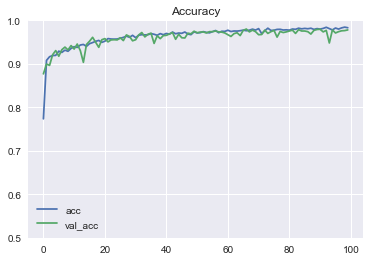

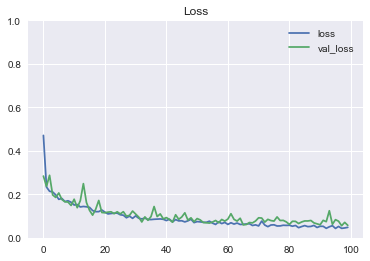

In [12]:
model_plots(history)

We can see our model doesn't show many signs of overfitting as our validation accuracy follows the training accuracy pretty closely. 

### Test the model

In [13]:
#Test on balanced test set
test_generator.reset()
step_size_test = test_generator.n // test_generator.batch_size
model_loss, model_acc, model_f1, model_recall, model_precision = model.evaluate_generator(generator = test_generator, steps = step_size_test)
print('Loss:', '%.2f'%model_loss, 'Acc:', '%.2f'%model_acc, 'F1 Score:', '%.2f'%model_f1, 'Recall:', '%.2f'%model_recall, 'Precision:', '%.2f'%model_precision)

Instructions for updating:
Please use Model.evaluate, which supports generators.
Loss: 0.04 Acc: 0.99 F1 Score: 0.99 Recall: 0.99 Precision: 0.99


In [14]:
#Test on unbalanced test set
test_generator_un.reset()
step_size_test_un = test_generator_un.n // test_generator_un.batch_size
model_loss, model_acc, model_f1, model_recall, model_precision = model.evaluate_generator(generator = test_generator_un, steps = step_size_test_un)
print('Loss:', '%.2f'%model_loss, 'Acc:', '%.2f'%model_acc, 'F1 Score:', '%.2f'%model_f1, 'Recall:', '%.2f'%model_recall, 'Precision:', '%.2f'%model_precision)

Loss: 0.04 Acc: 0.98 F1 Score: 0.92 Recall: 0.97 Precision: 0.89


Looks like our model performs fairly well on both the balanced and unbalanced test sets. In contrast to the balanced test set, the baseline accuracy for the unbalanced test set is 88.89%, which can be achieved by annotating all buildings as the majority class Damaged. So to see an accuracy of 98% is a marked improvement. Since recall is higher than precision, our model is better at finding members of the positive class than correctly classifying members of the positive class. This means our model has very little false negatives and the classifier is more permissive in the criteria for classifying something as positive. 

#### Save Model for future use

In [15]:
# save model
model.save(r"C:\Users\Jake Wojcik\Documents\Springboard\DS Career Track Course\Capstone_3\Models\model_final_ov_ep100")

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: C:\Users\Jake Wojcik\Documents\Springboard\DS Career Track Course\Capstone_3\Models\model_final_ov_ep100\assets


### Load Model and look at the architecture

In [16]:
from keras.models import load_model
#load saved model from folder
loaded_model = load_model(r"C:\Users\Jake Wojcik\Documents\Springboard\DS Career Track Course\Capstone_3\Models\model_final_ov_ep100", custom_objects = {'f1_m':f1_m, 'recall_m':recall_m, 'precision_m':precision_m})
loaded_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 126, 126, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 61, 61, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 30, 30, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 28, 28, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 14, 14, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 12, 12, 128)       1

#### Summarize our model performance metrics from our saved model

In [17]:
step_size_train = train_generator.n // train_generator.batch_size
step_size_val = validation_generator.n // validation_generator.batch_size

#retrieve training metrics for saved model
train_generator.reset()
train_loss, train_acc, train_f1, train_recall, train_precision = loaded_model.evaluate_generator(generator = train_generator, steps=step_size_train)

#retrieve validation metrics for saved model
validation_generator.reset()
val_loss, val_acc, val_f1, val_recall, val_precision = loaded_model.evaluate_generator(generator = validation_generator, steps = step_size_val)

#retrieve test metrics for saved model
test_generator.reset()
test_loss, test_acc, test_f1, test_recall, test_precision = loaded_model.evaluate_generator(generator = test_generator)

test_generator_un.reset()
test_un_loss, test_un_acc, test_un_f1, test_un_recall, test_un_precision = loaded_model.evaluate_generator(generator = test_generator_un)


In [29]:
print('TRAINING')
print('Loss:', "%.2f" % train_loss, 'Acc:', "%.2f" % train_acc, 'F1 Score:', "%.2f" % train_f1, 'Recall:', "%.2f" % train_recall, 'Precision:', "%.2f" % train_precision)
print('')
print('VALIDATION')
print('Loss:', "%.2f" % val_loss, 'Acc:', "%.2f" % val_acc, 'F1 Score:', "%.2f" % val_f1, 'Recall:', "%.2f" % val_recall, 'Precision:', "%.2f" % val_precision)
print("")
print('BALANCED TEST')
print('Loss:', "%.2f" % test_loss, 'Acc:', "%.2f" % test_acc, 'F1 Score:', "%.2f" % test_f1, 'Recall:', "%.2f" % test_recall, 'Precision:', "%.2f" % test_precision)
print("")
print('UNBALANCED TEST')
print('Loss:', "%.2f" % test_un_loss, 'Acc:', "%.2f" % test_un_acc, 'F1 Score:', "%.2f" % test_un_f1, 'Recall:', "%.2f" % test_un_recall, 'Precision:', "%.2f" % test_un_precision)

TRAINING
Loss: 0.04 Acc: 0.98 F1 Score: 0.98 Recall: 0.99 Precision: 0.98

VALIDATION
Loss: 0.06 Acc: 0.98 F1 Score: 0.98 Recall: 0.99 Precision: 0.97

BALANCED TEST
Loss: 0.04 Acc: 0.99 F1 Score: 0.99 Recall: 0.99 Precision: 0.99

UNBALANCED TEST
Loss: 0.04 Acc: 0.98 F1 Score: 0.92 Recall: 0.97 Precision: 0.89


### ROC & Precision Recall Curve

We'll use an ROC curve for our balanced test set and a precision-recall curve for the unbalanced test set.

In [19]:
# encode damage to 0 and no_damaged to 1 in order to plot ROC 
train_df['damage'].loc[train_df.damage == "damage"] = 0
train_df['damage'].loc[train_df.damage == "no_damage"] = 1
test_balanced_df['damage'].loc[test_balanced_df.damage == "damage"] = 0
test_balanced_df['damage'].loc[test_balanced_df.damage == "no_damage"] = 1
test_unbalanced_df['damage'].loc[test_unbalanced_df.damage == "damage"] = 0
test_unbalanced_df['damage'].loc[test_unbalanced_df.damage == "no_damage"] = 1

C:\Users\public\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


#### Balanced Test set

In [20]:
test_generator.reset()
predict_proba = loaded_model.predict(test_generator)
pred = np.multiply((predict_proba > 0.5), 1)
df_results = test_balanced_df.copy()
df_results['pred'] = pred

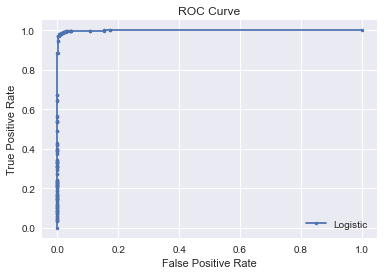

AUC Score: 0.999


In [21]:
from sklearn.metrics import precision_recall_curve, roc_curve, auc
recall,precision, thresholds = roc_curve(test_balanced_df.damage.astype(int),predict_proba)

#plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
plt.plot(recall, precision, marker='.', label='Logistic')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.title('ROC Curve')
plt.show()

print('AUC Score: %.3f'% auc(recall, precision))

#### Unbalanced test set

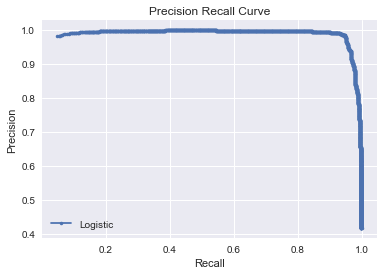

AUC Score: 0.987


In [22]:
test_generator_un.reset()
predict_proba = loaded_model.predict(test_generator_un)
pred = np.multiply((predict_proba > 0.5), 1)
df_results_un = test_unbalanced_df.copy()
df_results_un['pred'] = pred
precision, recall,thresholds = precision_recall_curve(test_unbalanced_df.damage.astype(int),predict_proba)

#plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
plt.plot(recall[:-1], precision[:-1], marker='.', label='Logistic')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.title('Precision Recall Curve')
plt.show()

print('AUC Score: %.3f'% auc(recall, precision))

Our model performs exceptionally well on both the balanced and unbalanced sets according to the AUC score. 



### Confusion Matrix

#### Balanced

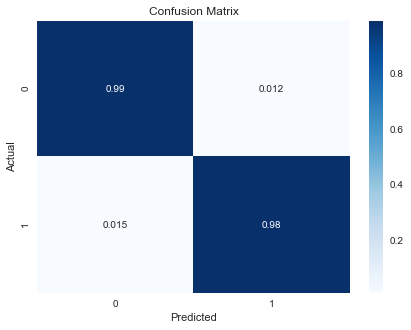

In [23]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

#create confusion matrix
cm = confusion_matrix(df_results.damage.astype(int), df_results.pred)
# Normalise
cm_normal = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

#plot confusion matrix
plt.figure(figsize = (7,5))
sns.heatmap(cm_normal, cmap = 'Blues', annot=True)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

Again, we see we have very few false positives and and false negatives.

#### Unbalanced

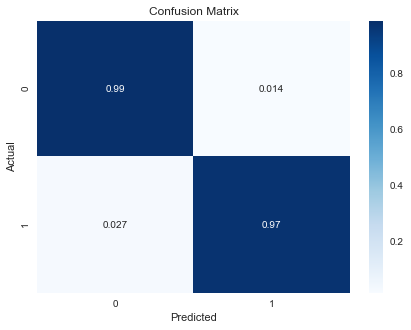

In [24]:
#create confusion matrix
cm_un = confusion_matrix(df_results_un.damage.astype(int), df_results_un.pred)
# Normalise
cm_normal_un = cm_un.astype('float') / cm_un.sum(axis=1)[:, np.newaxis]

#plot confusion matrix
plt.figure(figsize = (7,5))
sns.heatmap(cm_normal_un, cmap = 'Blues', annot=True)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

Although our model doesn't perform quite as well on the unbalanced set compared to the balanced set, It still performs very well. We have slightly more false negatives than false positives. 


### Exploring misclassified images

We should investigate a few typical cases where the algorithm makes wrong classification to see if any intuition
can be derived. We'll look at false positives (images that were predicted as damaged but were actually undamaged) and false negatives (images that were predicted as undamaged but were actually damaged). We will take a look at the misclassifications of the unbalanced test set. 


In [25]:
# create dataframes for false postives and false negatives 
false_negatives = df_results_un.loc[(df_results_un.damage==0) & (df_results_un.pred==1)].reset_index()
false_positives = df_results_un.loc[(df_results_un.damage==1) & (df_results_un.pred==0)].reset_index()

In [26]:
false_negatives.shape

(115, 9)

In [27]:
false_positives.shape

(27, 9)

#### Plot False Positive Images

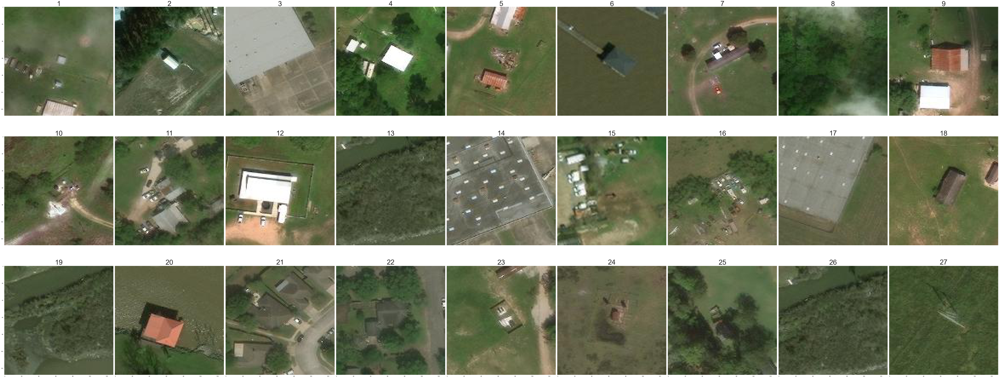

In [41]:
fig, ax = plt.subplots(nrows=3, ncols=9, sharex=True, sharey=True, figsize=(100,40))

ax = ax.flatten()
for i in range(27):
    ax[i].imshow(false_positives['image'][i])
    ax[i].set_title(i+1,fontsize=50)
    ax[i].grid(False)
fig.tight_layout()
plt.show()


Out of 1000 possible undamaged images the CNN classified only 27 incorrectly. We hypothesize that the algorithm could predict the damage through flood water and/or debris edges. Under such a hypothesis, the building in the center of image 3, the water in image 6 and 20, the cloud covering in image 1 and 8 and the parking lot with scattered cars in image 14 can potentially mislead the model. The model seems to misclassify scattered cars or "junk" in people's yard as debris. 

#### Plot False Negative Images

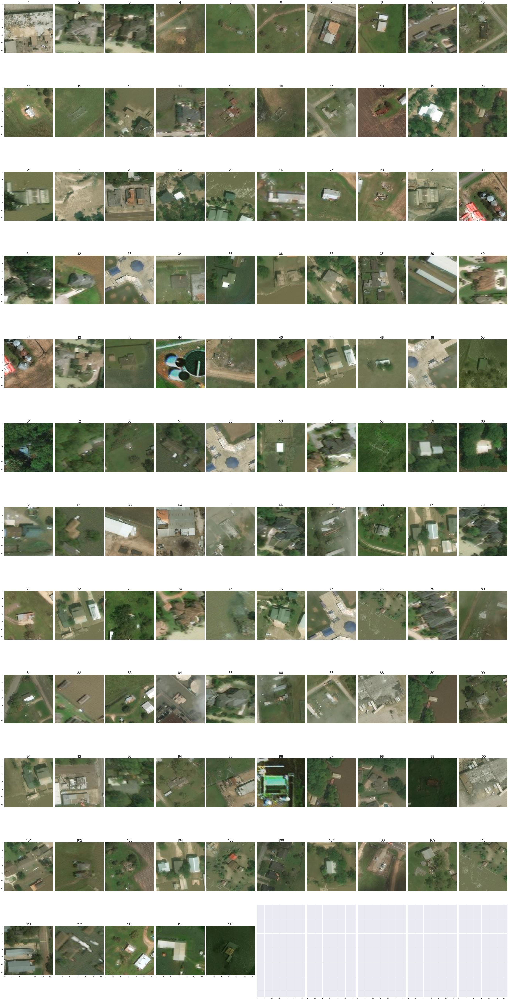

In [33]:
fig, ax = plt.subplots(nrows=12, ncols=10, sharex=True, sharey=True, figsize=(50,100))

ax = ax.flatten()
for i in range(115):
    ax[i].imshow(false_negatives['image'][i])
    ax[i].set_title(i+1,fontsize=50)
    ax[i].grid(False)
fig.tight_layout()
plt.show()


Out of the possible 8000 damaged images the CNN classified only 115 incorrectly. For the false negative cases in above, it is harder to make sense out of the prediction. Even through careful visual inspection, we cannot see image 40  as being flooded/damaged. This image, in particular, is more blurry than the rest of the images. It could potentially be labeling mistakes by the volunteers due to the blurriness. On the other hand,  many of the images are clearly flooded/damaged, but the algorithm misses them. in the case of images 4, 17, 65, 67, 84, and 87 the cloud cover might be misleading the model as we saw before.  We see the algorithm misclassify the baseball diamond in images 33, 49, 55, and 77. Perhaps this is because of the unique structure of the diamond. Although these images don't look flooded or damaged in my eyes, so perhaps its a labelling mistake as well. 

## Interpreting the model 